In [2]:
import pandas as pd
import scanpy as sc

import matplotlib as mpl
import matplotlib.pyplot as plt
from copy import copy

vir = copy(mpl.cm.viridis)
vir.set_under("lightgray")

In [3]:
adata = sc.read_h5ad('Progenitor_Neuron.h5ad')

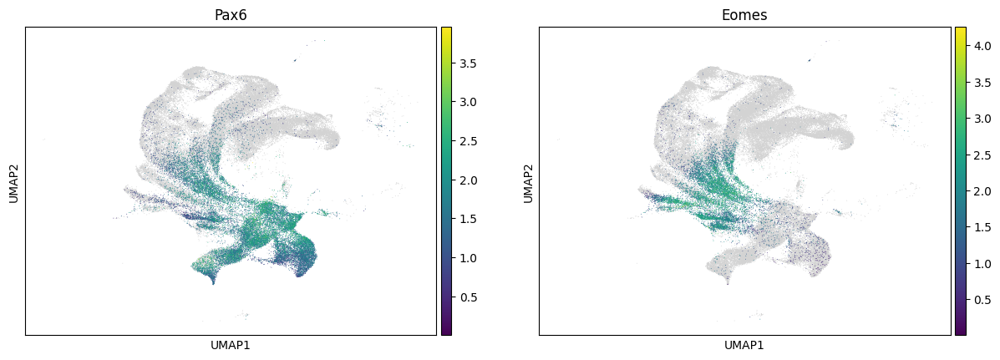

In [3]:
sc.pl.umap(adata,color = ['Pax6','Eomes'],color_map = vir,vmin = 0.0000001,
           gene_symbols = 'gene_short_name')

In [15]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata.layers['plot'] = adata.X.copy()

In [22]:
sc.pp.scale(adata)

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.13/lib/pyth

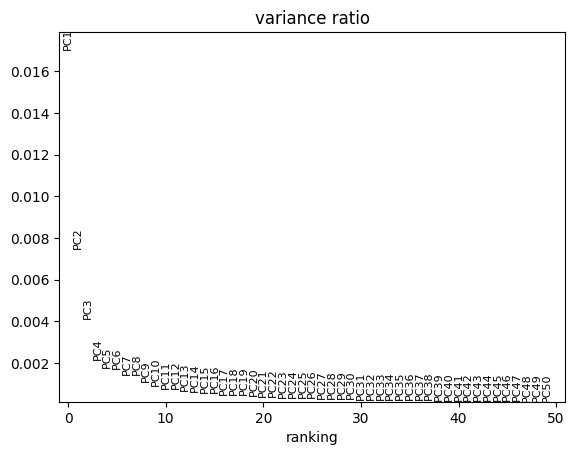

In [23]:
sc.tl.pca(adata,svd_solver = 'auto')
sc.pl.pca_variance_ratio(adata,n_pcs=50)

In [34]:
sc.pp.neighbors(adata,metric = 'sqeuclidean',n_pcs = 8,n_neighbors = 30)
sc.tl.umap(adata,min_dist = 0.3)

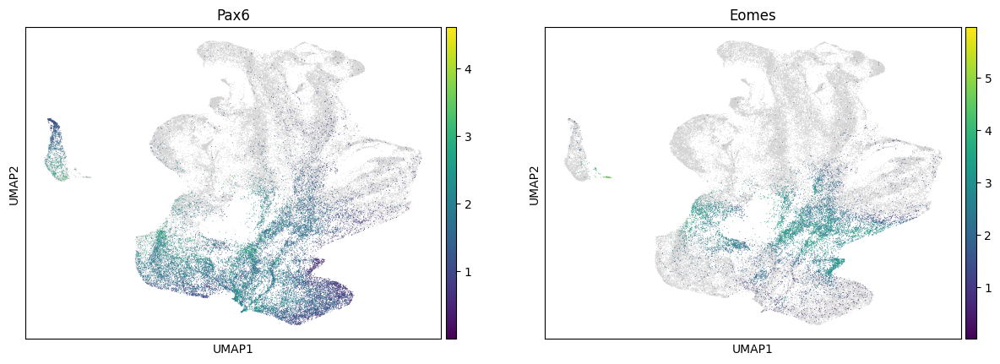

In [35]:
sc.pl.umap(adata,color = ['Pax6','Eomes'],color_map = vir,vmin = 0.0000001,
           gene_symbols = 'gene_short_name')

In [3]:
adata.obs['New_cellType'].value_counts()

New_cellType
Apical progenitors          18491
UL CPN                      14041
Migrating neurons           12332
Intermediate progenitors     8490
Layer 4                      5317
CThPN                        4607
DL CPN                       3106
Immature neurons             3092
SCPN                         2987
Layer 6b                      194
Name: count, dtype: int64

In [8]:
adata.obs['age'].value_counts()

age
E18    13114
E15     9961
E13     8403
E12     7753
P1      7753
E17     6919
E16     4864
E14     4002
P4      3783
E11     3710
E10     2395
Name: count, dtype: int64

In [4]:
adata.obs['time'] = adata.obs['age'].replace(['E10', 'E11', 'E12', 'E13', 'E14'],'E10-E14')

/var/folders/zn/t9jjvbrn56db3dmnfrqck3640000gn/T/ipykernel_1627/3988771505.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['time'] = adata.obs['age'].replace(['E10', 'E11', 'E12', 'E13', 'E14'],'E10-E14')


In [5]:
adata.obs['time'].replace(['E15','E16','E17','E18','P1','P4'],'E15-P4',inplace=True)

/var/folders/zn/t9jjvbrn56db3dmnfrqck3640000gn/T/ipykernel_1627/3320288031.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  adata.obs['time'].replace(['E15','E16','E17','E18','P1','P4'],'E15-P4',inplace=True)
/var/folders/zn/t9jjvbrn56db3dmnfrqck3640000gn/T/ipykernel_1627/3320288031.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_

In [10]:
adata.obs['time'].value_counts()

time
E15-P4     46394
E10-E14    26263
Name: count, dtype: int64

In [5]:
adata.obs['celltype'].astype('str')

E10_v1_AAACCTGAGGGTCTCC-1    AP
E10_v1_AAACCTGCACAACGCC-1    IP
E10_v1_AAACCTGCACGACGAA-1    AP
E10_v1_AAACCTGCAGACAAGC-1    AP
E10_v1_AAACCTGCAGAGCCAA-1    AP
                             ..
P4_TTTGGTTGTTAGAACA-1        EN
P4_TTTGTCAAGGGATCTG-1        EN
P4_TTTGTCAGTAAGGATT-1        EN
P4_TTTGTCATCCGTTGTC-1        EN
P4_TTTGTCATCGATGAGG-1        EN
Name: celltype, Length: 72657, dtype: object

In [6]:
adata.obs['age-type'] = adata.obs['time'].astype('str') + '-' + adata.obs['celltype'].astype('str')

In [9]:
adata.obs['celltype'].value_counts()

celltype
EN     45676
vRG    18491
IP      8490
Name: count, dtype: int64

In [8]:
adata.obs['celltype'].replace('AP','vRG',inplace = True)

/var/folders/zn/t9jjvbrn56db3dmnfrqck3640000gn/T/ipykernel_1627/3476694260.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  adata.obs['celltype'].replace('AP','vRG',inplace = True)
/var/folders/zn/t9jjvbrn56db3dmnfrqck3640000gn/T/ipykernel_1627/3476694260.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.

In [8]:
adata.obs['celltype'] = adata.obs['celltype'].astype('str')

In [10]:
plt.rcParams['figure.dpi'] = 1500

In [19]:
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(adata,color = 'celltype',size = 5,save = 'mouse_cerebral_cortex_umap.pdf')

In [47]:
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(adata,color = 'Syngap1',size = 5,
               color_map = vir,vmin = 0.0000001,
               save = 'Mouse_cerebral_cortex_Syngap1_feature.pdf')

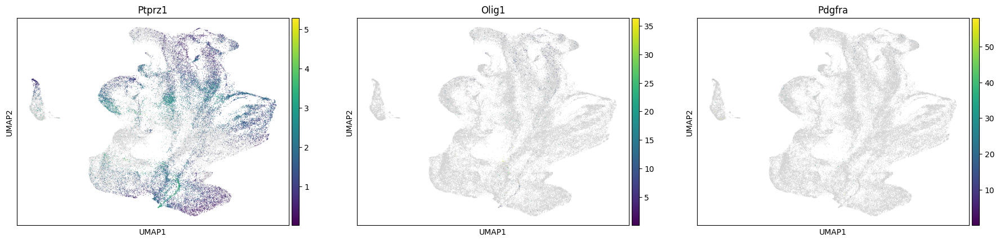

In [36]:
sc.pl.umap(adata,color = ['Ptprz1','Olig1','Pdgfra'],color_map = vir,vmin = 0.0000001,
           gene_symbols = 'gene_short_name')

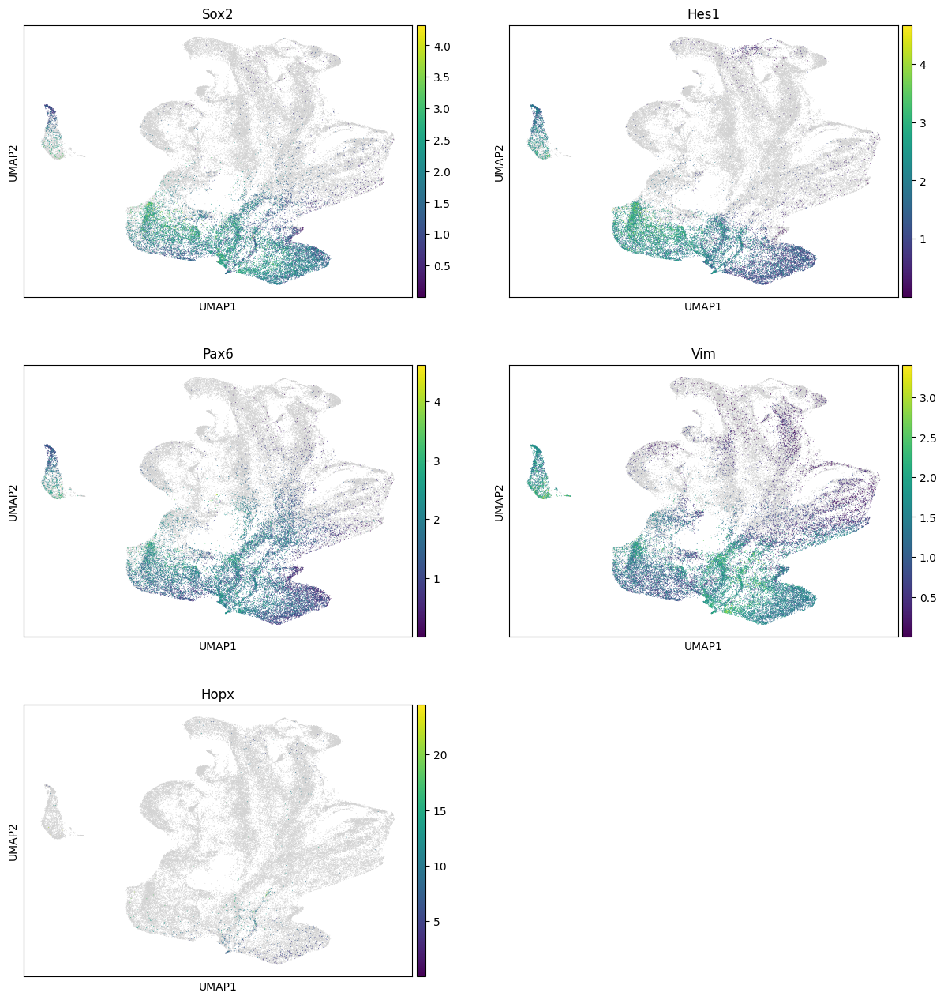

In [41]:
sc.pl.umap(adata,color = ['Sox2','Hes1','Pax6','Vim','Hopx'],color_map = vir,vmin = 0.0000001,
           gene_symbols = 'gene_short_name',ncols = 2)

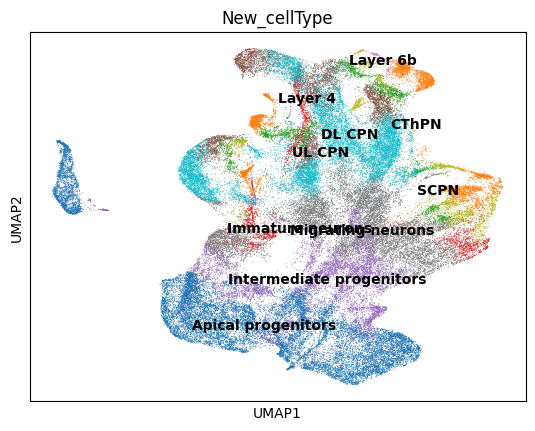

In [40]:
sc.pl.umap(adata,color = 'New_cellType',legend_loc = 'on data')

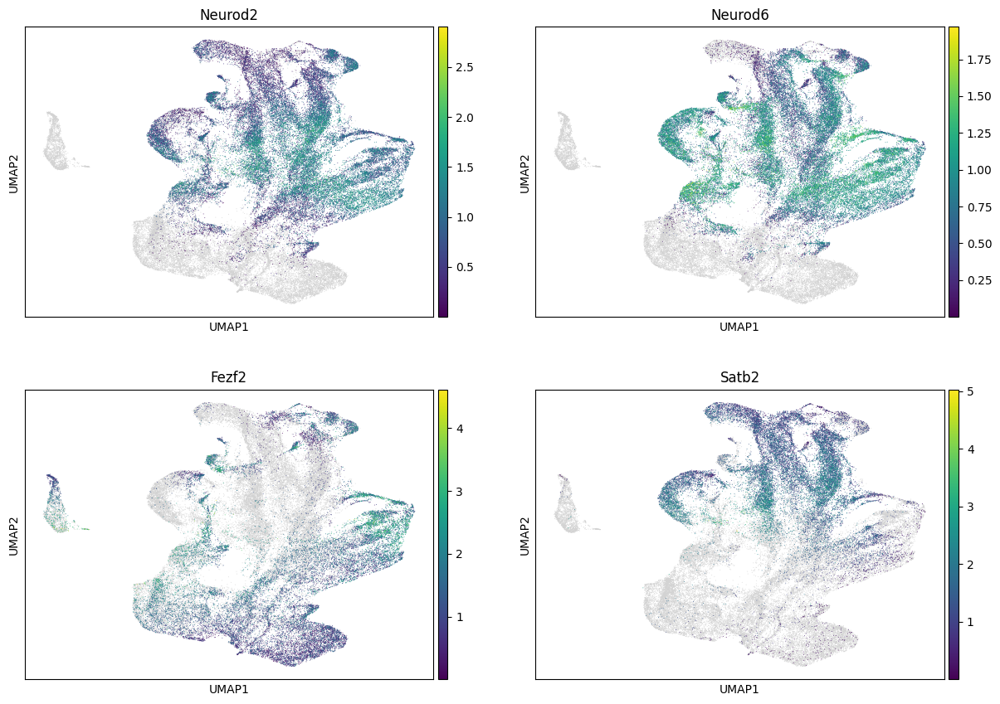

In [42]:
sc.pl.umap(adata,color = ['Neurod2','Neurod6','Fezf2','Satb2'],color_map = vir,vmin = 0.0000001,
           gene_symbols = 'gene_short_name',ncols = 2)

In [61]:
adata.obs['Hopx'] = (adata[:,'Hopx'].X == 0).todense()

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/IPython/core/interactiveshell.py:3549: SparseEfficiencyWarning: Comparing a sparse matrix with 0 using == is inefficient, try using != instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [60]:
(adata[:,'Hopx'].X == 0).todense()

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/IPython/core/interactiveshell.py:3549: SparseEfficiencyWarning: Comparing a sparse matrix with 0 using == is inefficient, try using != instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


matrix([[ True],
        [ True],
        [ True],
        ...,
        [ True],
        [ True],
        [ True]])

In [66]:
adata.obs['celltype'] = adata.obs['celltype'].astype('str')
adata.obs['celltype'][(adata.obs['celltype']!= 'EN') & (adata.obs['Hopx'] == False) ] = 'Hopx+'

/var/folders/zn/t9jjvbrn56db3dmnfrqck3640000gn/T/ipykernel_44883/1394125447.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.obs['celltype'][(adata.obs['celltype']!= 'EN') & (adata.obs['Hopx'] == False) ] = 'Hopx+'
/var/folders/zn/t

In [67]:
adata.obs['celltype'].value_counts()

celltype
EN       45676
AP       17936
IP        8403
Hopx+      642
Name: count, dtype: int64

In [7]:
plt.rcParams['figure.dpi'] = 300

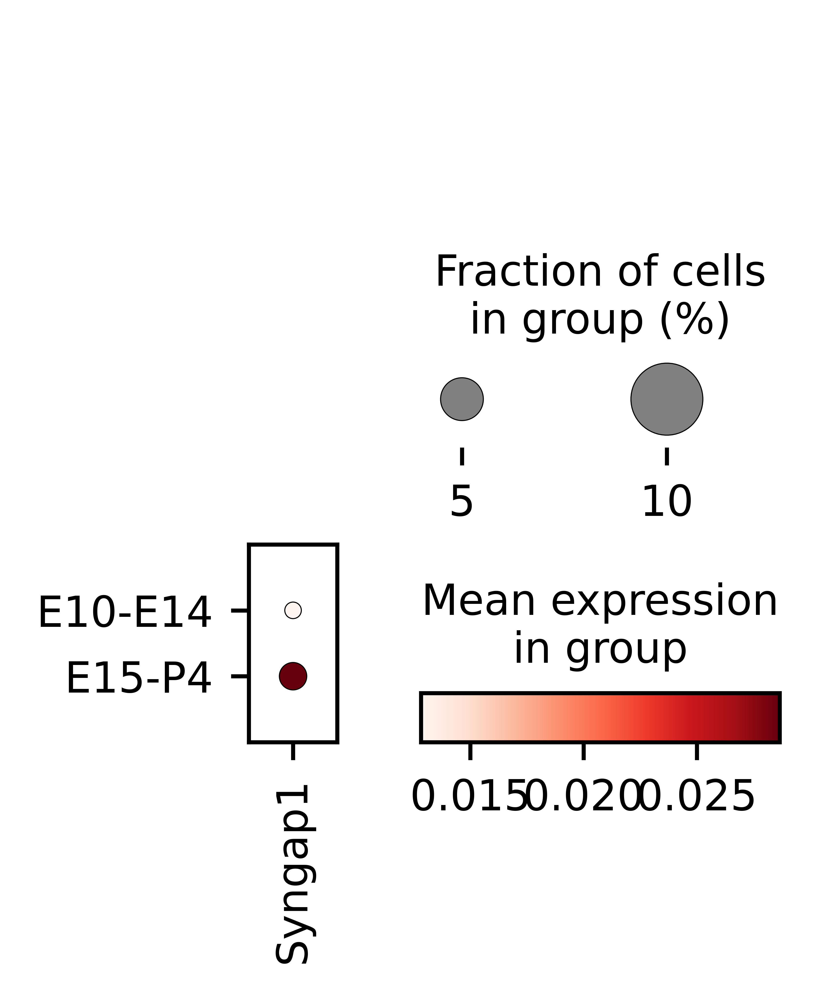

In [33]:
sc.pl.dotplot(adata,groupby = 'time',var_names = ['Syngap1'])

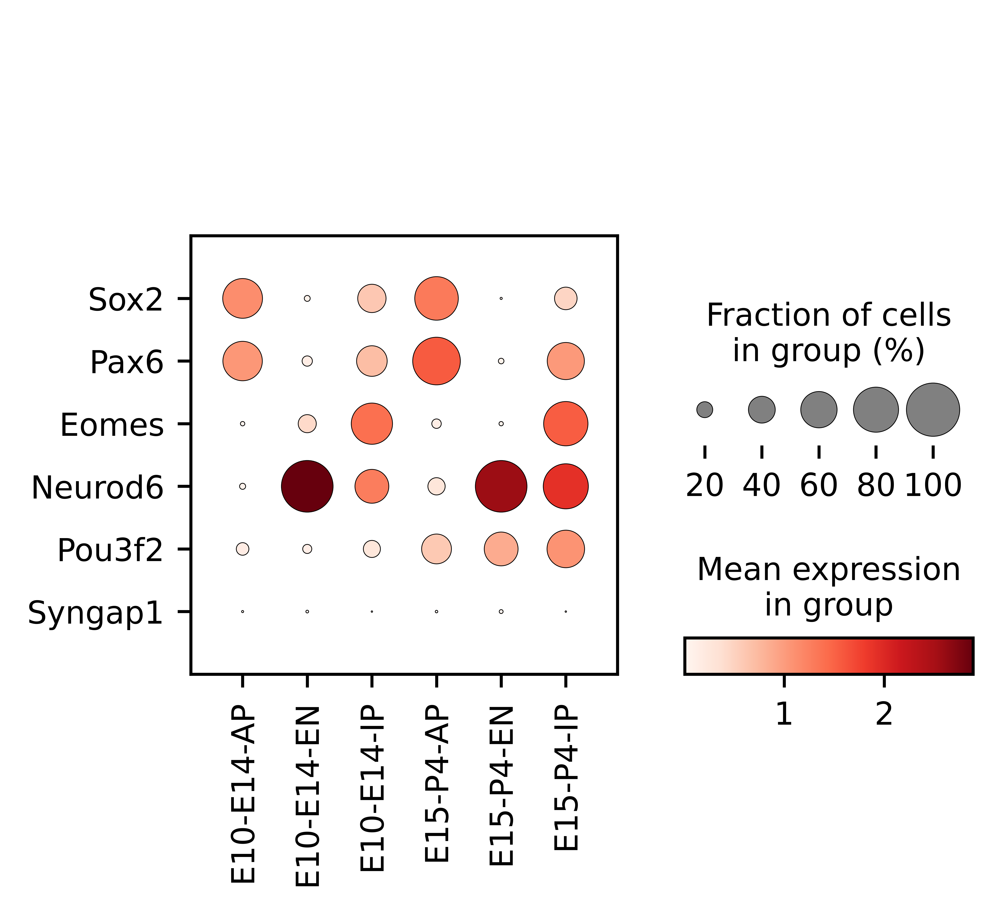

In [ ]:
sc.pl.dotplot(adata,groupby = 'age-type',var_names = ['Sox2','Pax6','Eomes',
                                                      'Neurod6','Pou3f2','Syngap1'],
                                                      
                                                      #standard_scale = 'group'
                                                      )

In [72]:
adata.obs.columns =['NAME', 'orig_ident', 'Gral_cellType', 'New_cellType', 'sex',
       'celltype', 'age', 'Hopx+']

In [12]:
adata.obs['time'].value_counts()

time
E15-P4     46394
E10-E14    26263
Name: count, dtype: int64

In [38]:
fig, axs = plt.subplots(1, 2,figsize = (8,4))

sc.pl.dotplot(adata[adata.obs['time'] == 'E10-E14',:],groupby = 'celltype',var_names = ['Sox2','Pax6','Eomes',
                                                      'Neurod6','Pou3f2','Syngap1'],
                                                      show = False,
                                                      ax = axs[0],
                                                      dot_min = 0,
                                                      vmax = 2.8,
                                                      categories_order=['EN','IP','vRG'],
                                                      #standard_scale = 'group'
                                                      )
axs[0].set_title('E10-E14')

sc.pl.dotplot(adata[adata.obs['time'] == 'E15-P4',:],groupby = 'celltype',var_names = ['Sox2','Pax6','Eomes',
                                                      'Neurod6','Pou3f2','Syngap1'],
                                                      show = False,
                                                      ax = axs[1],
                                                      dot_min = 0,
                                                      vmax = 2.8,
                                                      categories_order=['EN','IP','vRG'],
                                                      #standard_scale = 'group'
                                                      )
axs[1].set_title('E15-P4')

plt.savefig('./figures/Mouse_cerebral_cortex_6_genes_no_scaling.pdf',bbox_inches='tight')


In [43]:
fig, axs = plt.subplots(1, 2,figsize = (8,4))

sc.pl.dotplot(adata[adata.obs['time'] == 'E10-E14',:],groupby = 'celltype',var_names = [
                                                      'Pou3f2','Syngap1'],
                                                      show = False,
                                                      ax = axs[0],
                                                      dot_max = 0.7,
                                                      #vmax = 1.1,
                                                      categories_order=['EN','IP','vRG'],
                                                      standard_scale = 'group'
                                                      )
axs[0].set_title('E10-E14')

sc.pl.dotplot(adata[adata.obs['time'] == 'E15-P4',:],groupby = 'celltype',var_names = [
                                                      'Pou3f2','Syngap1'],
                                                      show = False,
                                                      ax = axs[1],
                                                      #dot_min = 0,
                                                      #vmax = 1.1,
                                                      categories_order=['EN','IP','vRG'],
                                                      standard_scale = 'group'
                                                      )
axs[1].set_title('E15-P4')

plt.savefig('./figures/Mouse_cerebral_cortex_2_genes_group_scale.pdf',bbox_inches='tight')
